In [1]:
!pip install -qU diffusers accelerate transformers huggingface_hub peft

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 66.8 MB/s eta 0:00:00


In [ ]:
from huggingface_hub import notebook_login
notebook_login()

# Load LoRAs for inference

There are many adapter types trained in different styles to achieve different effects. We can even combine multiple adapters to create new and unique images.

In this session, we will load and manage adapters for inference with the HuggingFace PEFT integration in Diffusers library.

We start with loading a pipeline with a Stable Diffusion XL (SDXL) checkpoint:

In [ ]:
from diffusers import DiffusionPipeline
import torch

pipe_id = 'stabilityai/stable-diffusion-xl-base-1.0'
pipe = DiffusionPipeline.from_pretrained(
    pipe_id,
    torch_dtype=torch.float16,
).to('cuda')

Next, we load a `CiroN2022/toy-face` adapter with the `load_lora_weights()` method. With the HuggingFace PEFT integration, we can assign a specific `adapter_name` to the checkpoint, which lets us easily switch between different LoRA checkpoints. We can also call this adapter `"toy"`:

In [4]:
pipe.load_lora_weights(
    'CiroN2022/toy-face',
    weight_name='toy_face_sdxl.safetensors',
    adapter_name='toy',
)

toy_face_sdxl.safetensors:   0%|          | 0.00/171M [00:00<?, ?B/s]

Make sure to include the token `toy_face` in the prompt and then we can perform inference:

  0%|          | 0/30 [00:00<?, ?it/s]

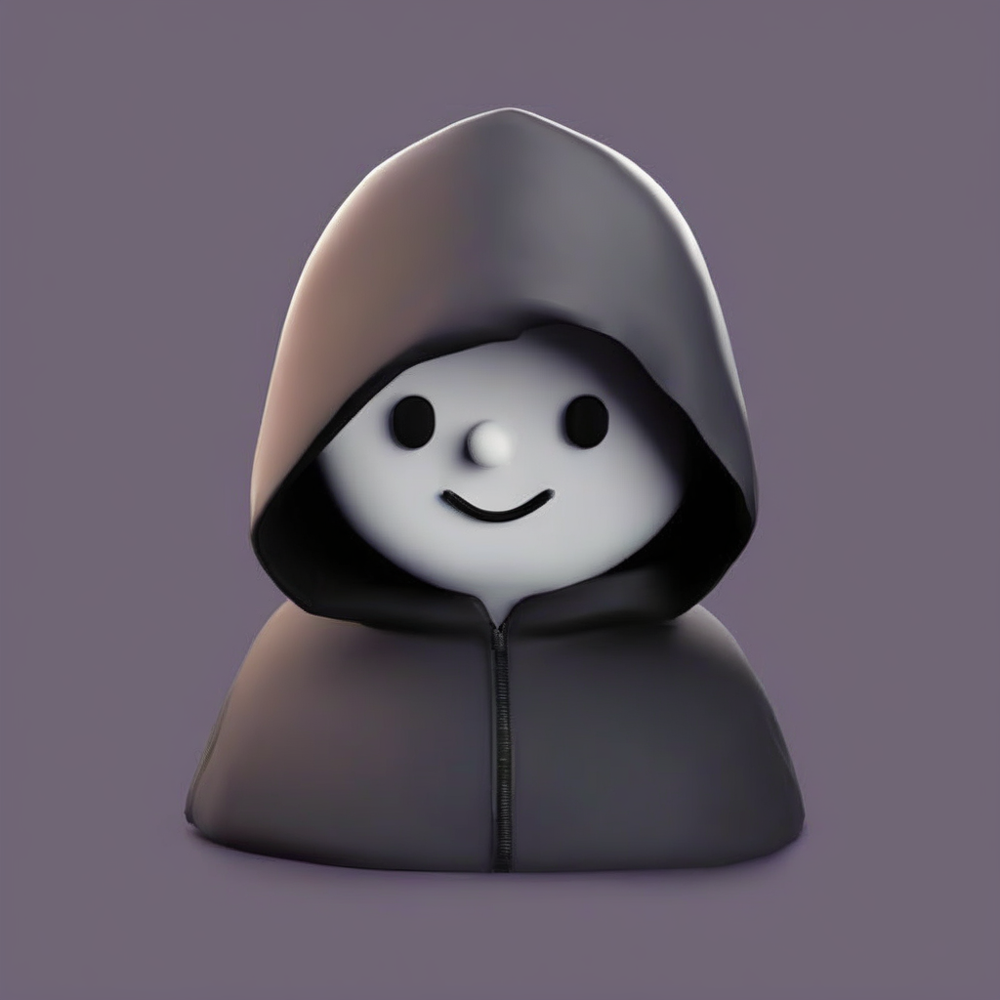

In [5]:
prompt = "toy_face of a hacker with a hoodie"

lora_scale = 0.9
image = pipe(
    prompt,
    num_inference_steps=30,
    cross_attention_kwargs={'scale': lora_scale},
    generator=torch.manual_seed(111),
).images[0]

image

With the `adapter_name` parameter, it is easily to use another adapter for inference. We now load the `nerijs/pixel-art-xl` adapter that has been fine-tuned to generate pixel art images and call it `"pixel"`.

In [6]:
pipe.load_lora_weights(
    'nerijs/pixel-art-xl',
    weight_name='pixel-art-xl.safetensors',
    adapter_name='pixel',
)

pixel-art-xl.safetensors:   0%|          | 0.00/171M [00:00<?, ?B/s]

The pipeline automatically sets the first loaded adapter (`"toy"`) as the active adapter, but we can activate the `"pixel"` adapter with the `set_adapters` method:

In [7]:
pipe.set_adapters('pixel')

Make sure we include the token `pixel art` in our prompt to generate a pixel art image:

  0%|          | 0/30 [00:00<?, ?it/s]

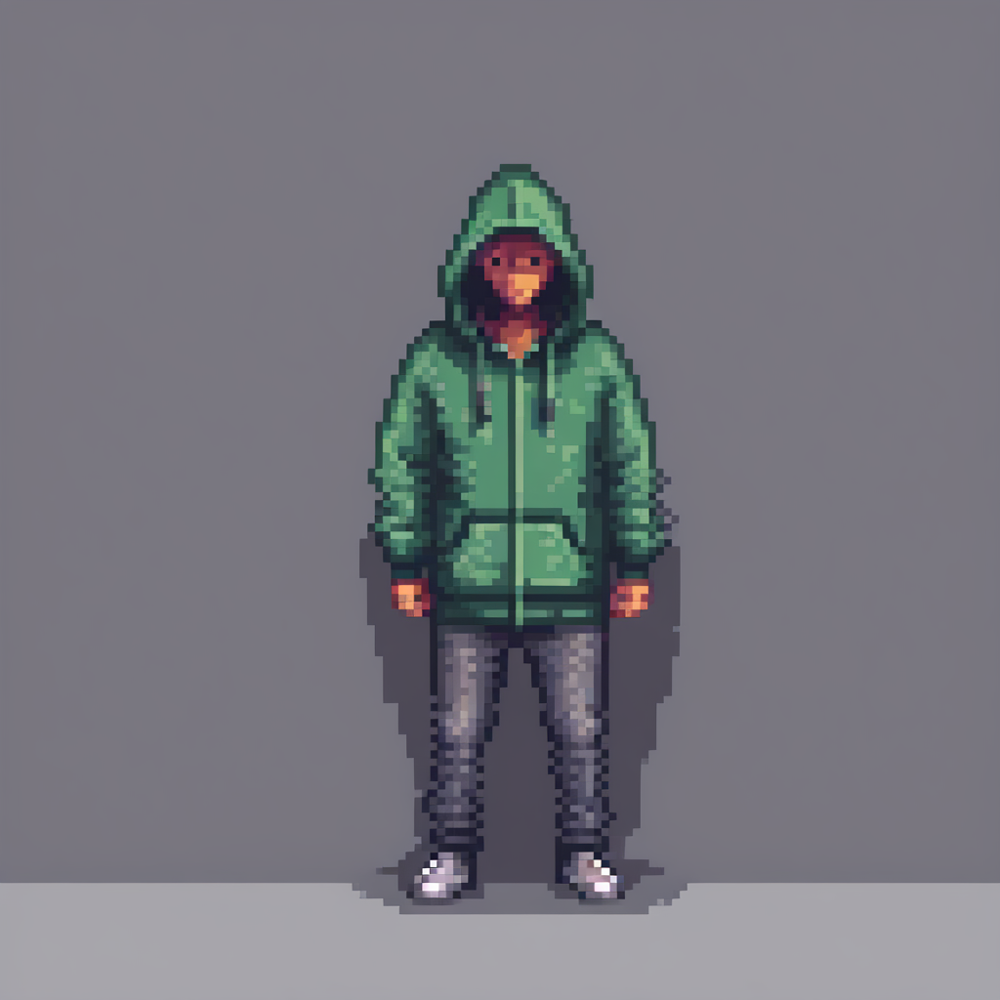

In [8]:
prompt = "a hacker with a hoodie, pixel art"

image = pipe(
    prompt,
    num_inference_steps=30,
    cross_attention_kwargs={'scale': lora_scale},
    generator=torch.manual_seed(111),
).images[0]

image

By default, if the most up-to-date versions of PEFT and Transformers are detected, `low_cpu_mem_usage = True` is set to speed up the loading time of LoRA checkpoints.

## Merge adapters

We can also merge different adapter checkpoints for inference to blend their styles together.

We will use the `set_adapters` method to activate the `pixel` and `toy` adapters and specify the weights for how they should be merged.

In [9]:
pipe.set_adapters(
    ['pixel', 'toy'],
    adapter_weights=[0.5, 1.0],
)

LoRA checkpoints in the diffusion community are almost obtained with `DreamBooth`, and the DreamBooth training often relies on "trigger" words in the input text prompts in order for the gnereation results to look as expected.

When we combine multiple LoRA checkpoints, it is important to ensure the trigger words for the corresponding LoRA checkpoints are present in the input text prompts.

  0%|          | 0/30 [00:00<?, ?it/s]

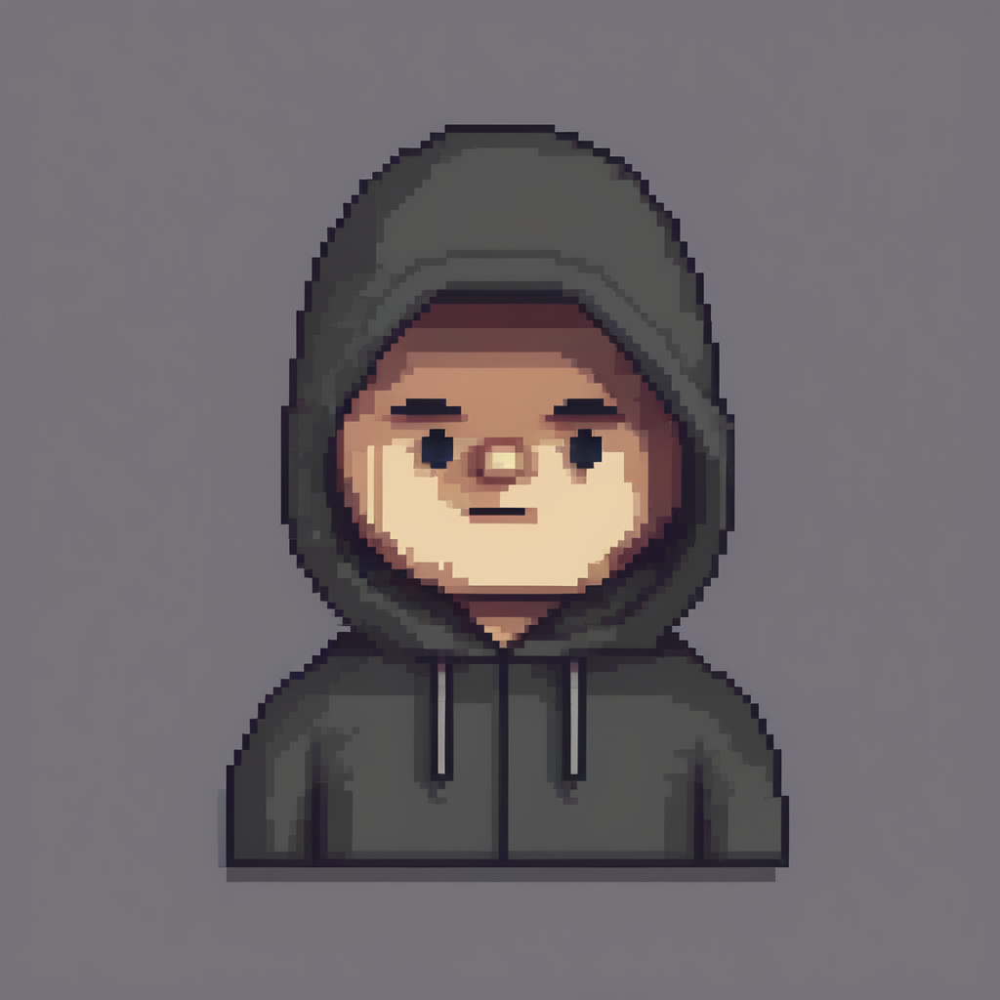

In [10]:
prompt = "tory_face of a hacker with a hoodie, pixel art"
image = pipe(
    prompt,
    num_inference_steps=30,
    cross_attention_kwargs={'scale': 1.0},
    generator=torch.manual_seed(111),
).images[0]

image

To return to only using one adapter, use the `set_adapters` method to activate the `"toy"` adapter:

  0%|          | 0/30 [00:00<?, ?it/s]

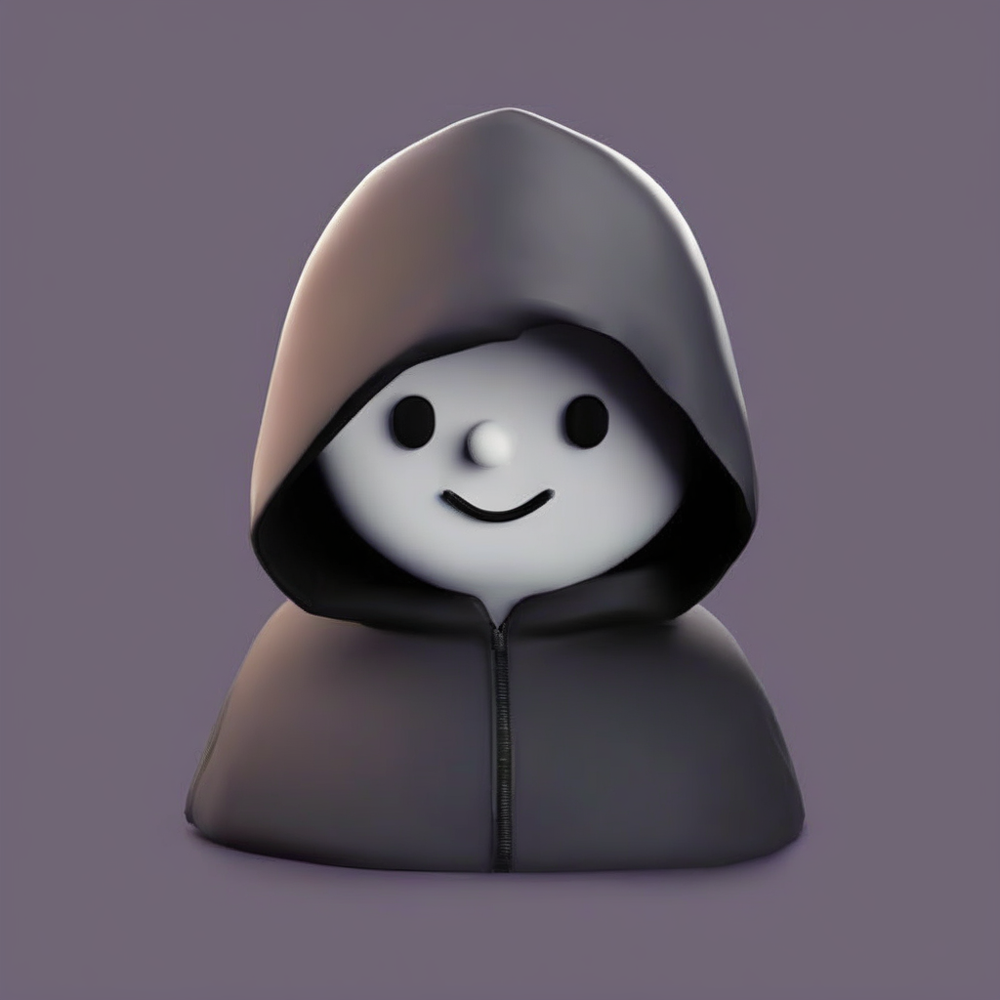

In [11]:
pipe.set_adapters('toy')

prompt = "toy_face of a hacker with a hoodie"
lora_sacle = 0.9
image = pipe(
    prompt,
    num_inference_steps=30,
    cross_attention_kwargs={'scale': lora_scale},
    generator=torch.manual_seed(111),
).images[0]
image

We can also disable all adapters entirely, using the `disable_lora` method to return the base model:

  0%|          | 0/30 [00:00<?, ?it/s]

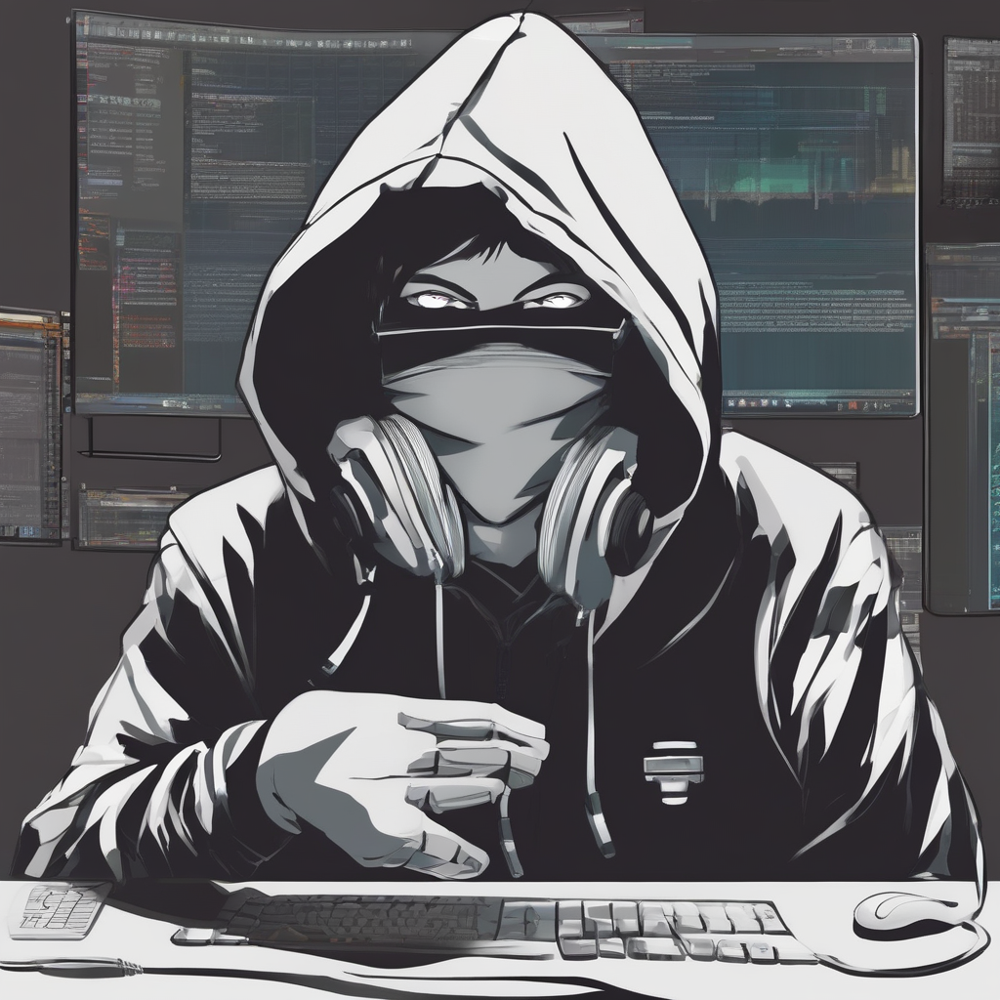

In [14]:
pipe.disable_lora()

prompt = "toy_face of a hacker with a hoodie"
image = pipe(
    prompt,
    num_inference_steps=30,
    generator=torch.manual_seed(111),
).images[0]

image

### Customize adapters strength

For more customization, we can control how strongly the adapter affects each part of the pipeline. We can pass a dictionary with the control strengths to `set_adapters`.

For example, we can turn on the adapter for the `down` parts, but turn it off for the `mid` and `up` parts in the UNet:

  0%|          | 0/30 [00:00<?, ?it/s]

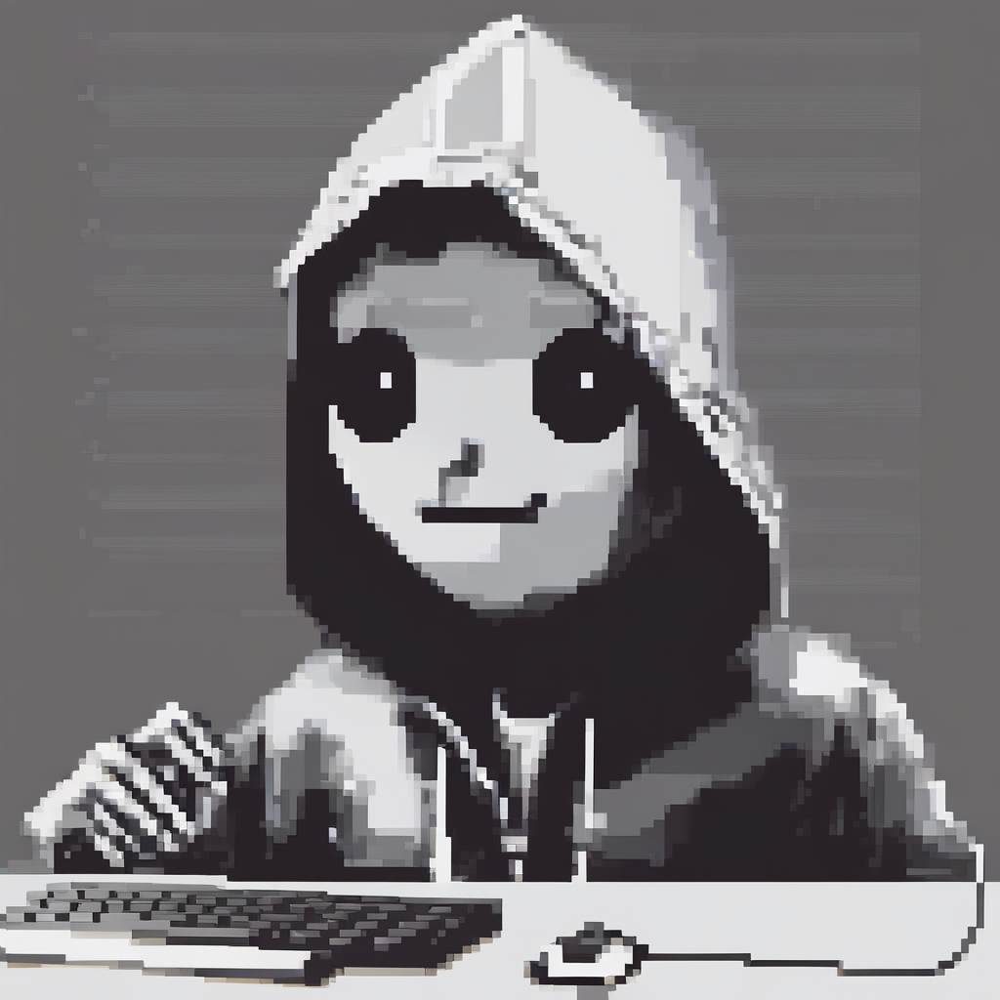

In [15]:
# After we disable lora above
pipe.enable_lora()

adapter_weight_scales = {
    "unet": {
        'down': 1,
        'mid': 0,
        'up': 0,
    }
}

pipe.set_adapters('pixel', adapter_weight_scales)
image = pipe(
    prompt,
    num_inference_steps=30,
    generator=torch.manual_seed(111),
).images[0]

image

We can also check how turning off the `down` part and turning on the `mid` and `up` part respectively changes the image.

  0%|          | 0/30 [00:00<?, ?it/s]

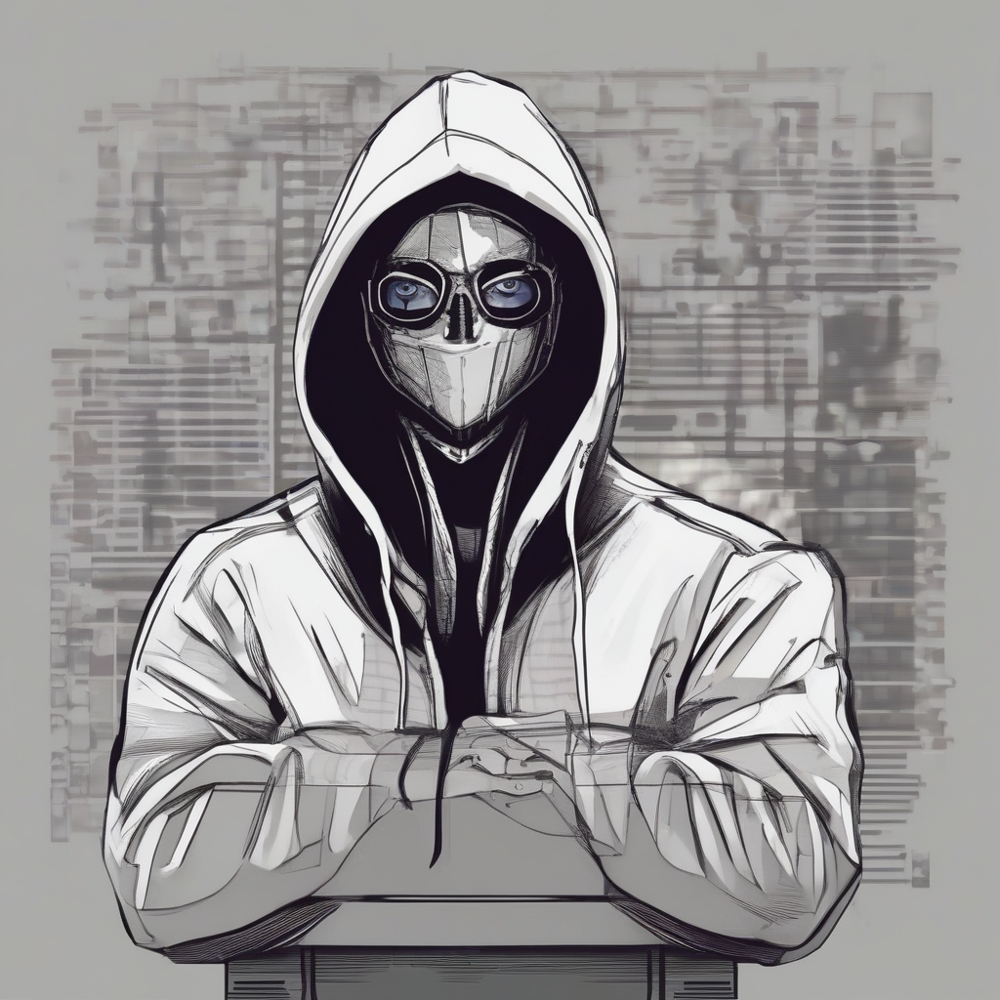

In [16]:
adapter_weight_scales = { "unet": { "down": 0, "mid": 1, "up": 0} }
pipe.set_adapters("pixel", adapter_weight_scales)
image = pipe(prompt, num_inference_steps=30, generator=torch.manual_seed(0)).images[0]
image

  0%|          | 0/30 [00:00<?, ?it/s]

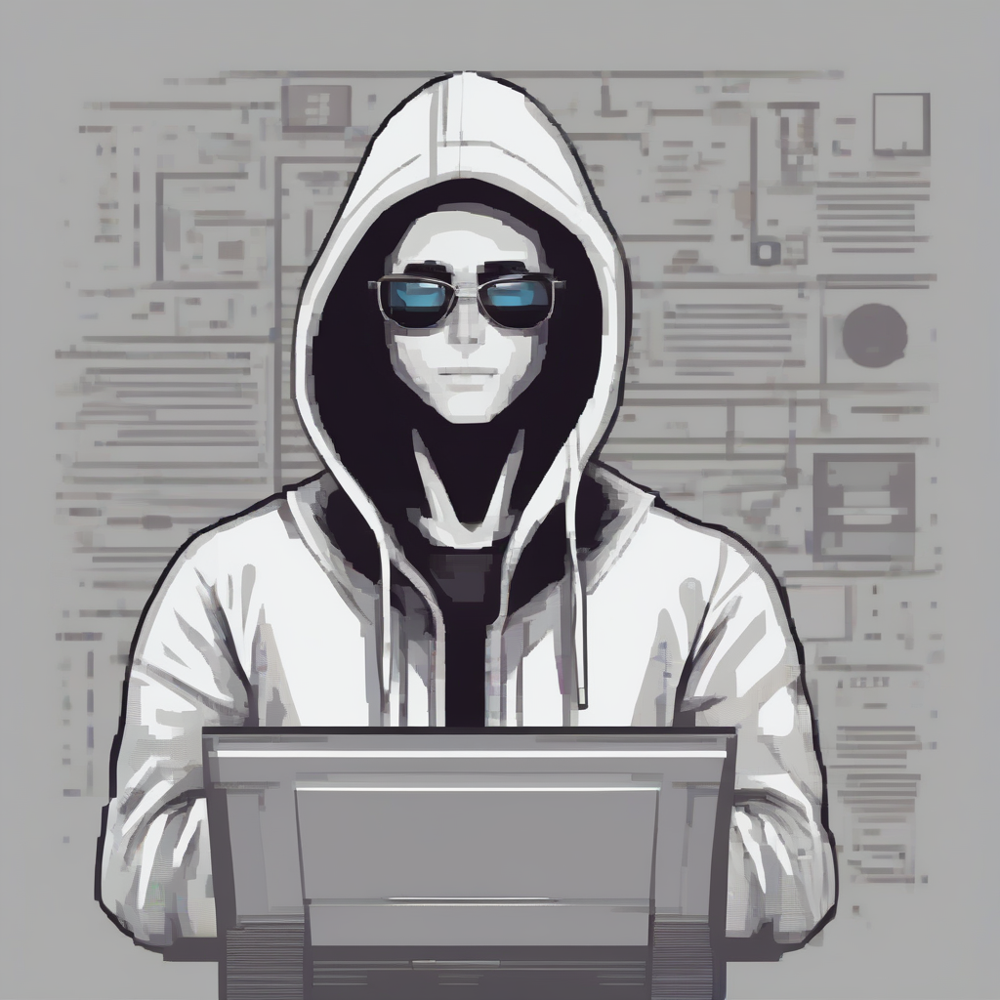

In [17]:
adapter_weight_scales = { "unet": { "down": 0, "mid": 0, "up": 1} }
pipe.set_adapters("pixel", adapter_weight_scales)
image = pipe(prompt, num_inference_steps=30, generator=torch.manual_seed(0)).images[0]
image

We can use this powerful feature to control the adapter strengths down to per-transformer level. In addition, we can even use it for multiple adapters:

  0%|          | 0/30 [00:00<?, ?it/s]

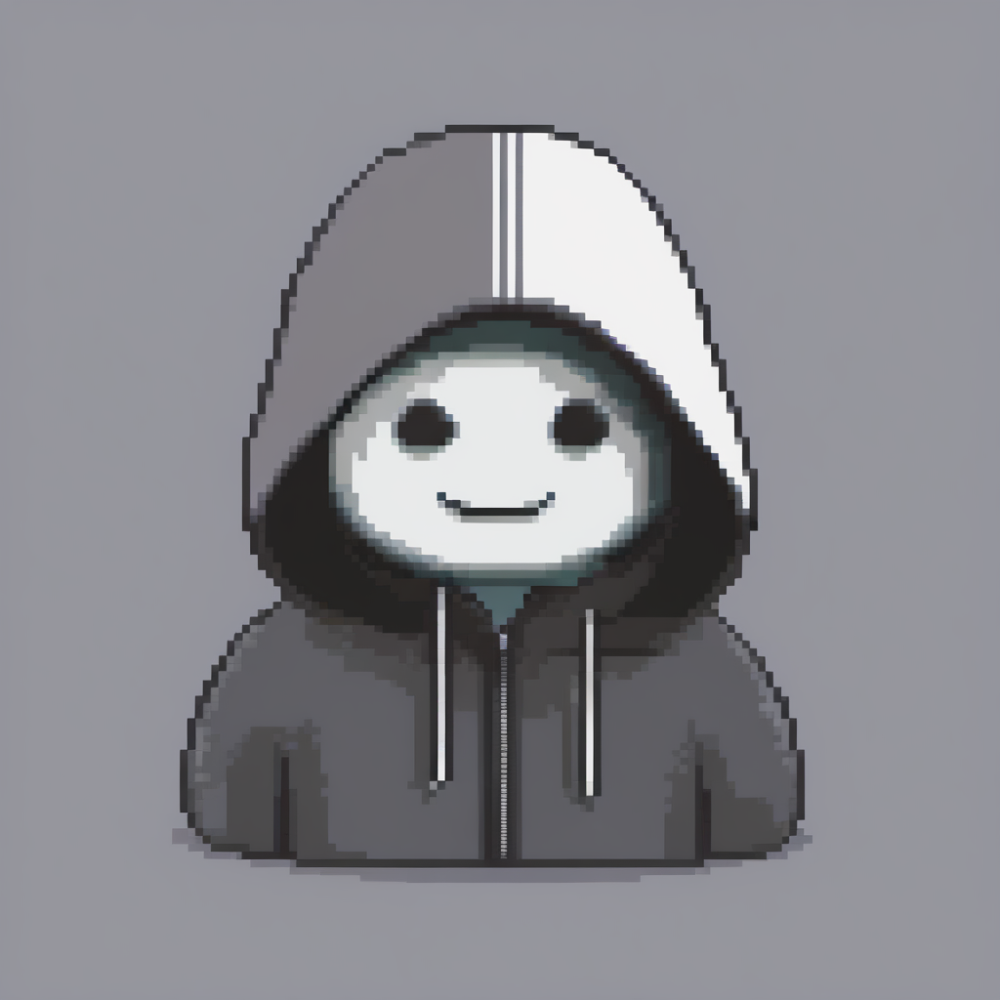

In [18]:
adapter_weight_scales_toy = 0.5
adapter_weight_scales_pixel = {
    'unet': {
        'down': 0.9, # all transformers in the down-part will use scale 0.9
        #'mid' # because in this example 'mid' is not given, all transformers in the mid part will use the default scale 1.0
        'up': {
            'block_0': 0.6, # all transformers in the 0th block in the up-part will use scale 0.6
            'block_1': [0.4, 0.8, 1.0], # the 3 transformers in the 1st block in the up-part will use scales 0.4, 0.8, 1.0 respectively
        }
    }
}

pipe.set_adapters(
    ['toy', 'pixel'],
    adapter_weights=[adapter_weight_scales_toy, adapter_weight_scales_pixel],
)
image = pipe(
    prompt,
    num_inference_steps=30,
    generator=torch.manual_seed(111),
).images[0]

image

## Manage adapters

If we attach multiple adapters and forget what adapters have been attached to the pipeline's components, we can use the `get_active_adapters()` method to check the list of active adapters

In [19]:
active_adapters = pipe.get_active_adapters()
active_adapters

['toy', 'pixel']

We can also get the active adapters of each pipeline component with `get_list_adapters()`:

In [20]:
list_adapters_component_wise = pipe.get_list_adapters()
list_adapters_component_wise

{'unet': ['toy', 'pixel']}

We can use `delete_adapters` to completely remove an adapter and their LoRA layers from a model:

In [21]:
pipe.delete_adapters('toy')
pipe.get_active_adapters()

['pixel']